In [1]:
import my_plotting
import markers
import importlib
import utils
import covax_constants
import CovidVAX_specific_utils
import GeneModules

importlib.reload(my_plotting);
importlib.reload(markers);
importlib.reload(utils);
importlib.reload(covax_constants);
importlib.reload(GeneModules);


import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy import stats
import numpy as np

import warnings
warnings.simplefilter("ignore")

from functools import partial
import scanpy as sc

import muon as mu
import anndata

In [2]:
# pbmc = sc.read_h5ad('gse171964_raw_anndata.h5ad')

# pbmc.var_names_make_unique()

In [2]:
myeloid = sc.read_h5ad('myeloid_1.h5ad')

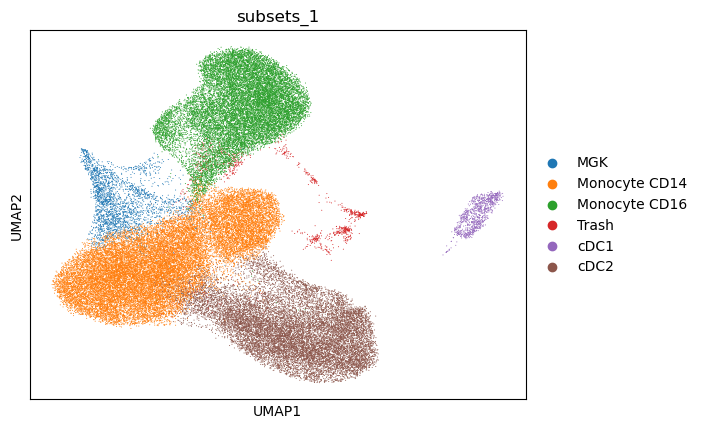

In [4]:
sc.pl.umap(myeloid, color = ['subsets_1'])

In [5]:
myeloid

AnnData object with n_obs × n_vars = 58164 × 17703
    obs: 'pt_id', 'day', 'clustnm', 'sample_id', 'n_genes', 'person', 'Visit', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'is_outlier', 'l070', 'l070_1', 'subsets_1'
    var: 'n_cells', 'is_rna', 'is_protein', 'highly_variable', 'mean', 'std'
    uns: 'Visit_colors', 'clustnm_colors', 'l070_1_colors', 'l070_colors', 'leiden', 'neighbors', 'pca', 'person_colors', 'sample_id_colors', 'subsets_1_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts', 'normalized'
    obsp: 'connectivities', 'distances'

In [6]:
cDC2 = myeloid[myeloid.obs.subsets_1 == 'cDC2'].copy()

In [7]:
rna = cDC2[:, cDC2.var.is_rna].copy()

In [8]:
rna.X = rna.layers['counts'].copy()

In [9]:
sc.pp.normalize_total(rna)
sc.pp.log1p(rna)

sc.pp.highly_variable_genes(rna)

In [10]:
adt = cDC2[:, cDC2.var.is_protein].copy()

adt.X = adt.layers['normalized'].copy()

In [11]:
adt.var['highly_variable'] = False

In [12]:
combined = anndata.concat([rna, adt], axis = 1)

In [13]:
combined.obs[rna.obs.columns] = rna.obs.copy()

In [14]:
combined.layers['normalized'] = combined.X.copy()

In [15]:
sc.pp.scale(combined, max_value=10)
sc.tl.pca(combined, svd_solver='arpack', use_highly_variable=True)

In [16]:
# sc.pp.neighbors(combined, n_pcs=25)
sc.external.pp.bbknn(combined, batch_key='person', n_pcs=25)
sc.tl.umap(combined)

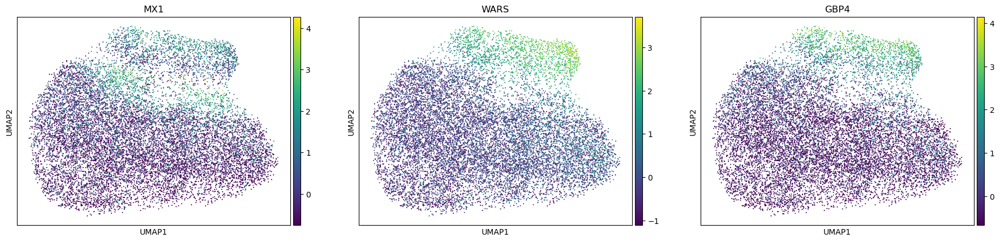

In [17]:
sc.pl.umap(combined, color = ['MX1', 'WARS', 'GBP4'])

In [18]:
sc.tl.leiden(combined, resolution=.2, key_added = 'l020')

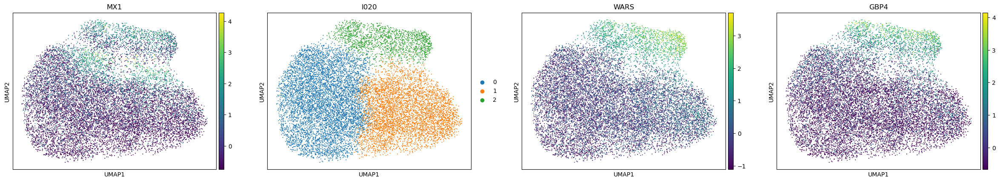

In [19]:
sc.pl.umap(combined, color = ['MX1', 'l020', 'WARS', 'GBP4'])

In [20]:
combined_1 =  combined[combined.obs.l020 != '2'].copy()

In [21]:
combined_1.X = combined_1.layers['normalized'].copy()

In [22]:
hvg = sc.pp.highly_variable_genes(combined_1[:, combined_1.var.is_rna], inplace=False, flavor='cell_ranger', n_top_genes=2000)

In [23]:
combined_1.var.highly_variable = False
combined_1.var.highly_variable.loc[combined_1.var.is_rna] = hvg['highly_variable'].values

In [24]:
sc.pp.scale(combined_1, max_value=10)
sc.tl.pca(combined_1, svd_solver='arpack', use_highly_variable=True)

In [25]:
# sc.pp.neighbors(combined, n_pcs=25)
sc.external.pp.bbknn(combined_1, batch_key='person', n_pcs=25)
sc.tl.umap(combined_1)

In [26]:
sc.tl.leiden(combined_1, key_added='l020', resolution=0.2)

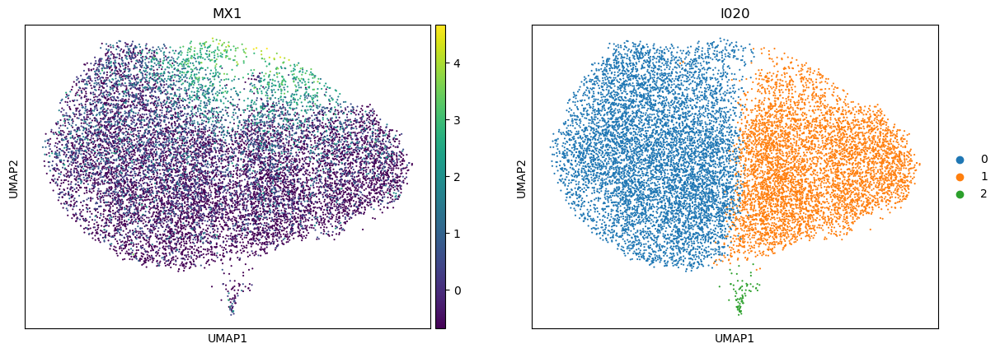

In [27]:
sc.pl.umap(combined_1, color = ['MX1', 'l020'])

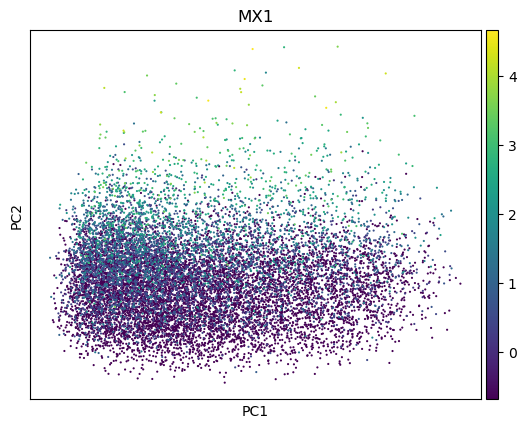

In [28]:
sc.pl.pca(combined_1, color="MX1")


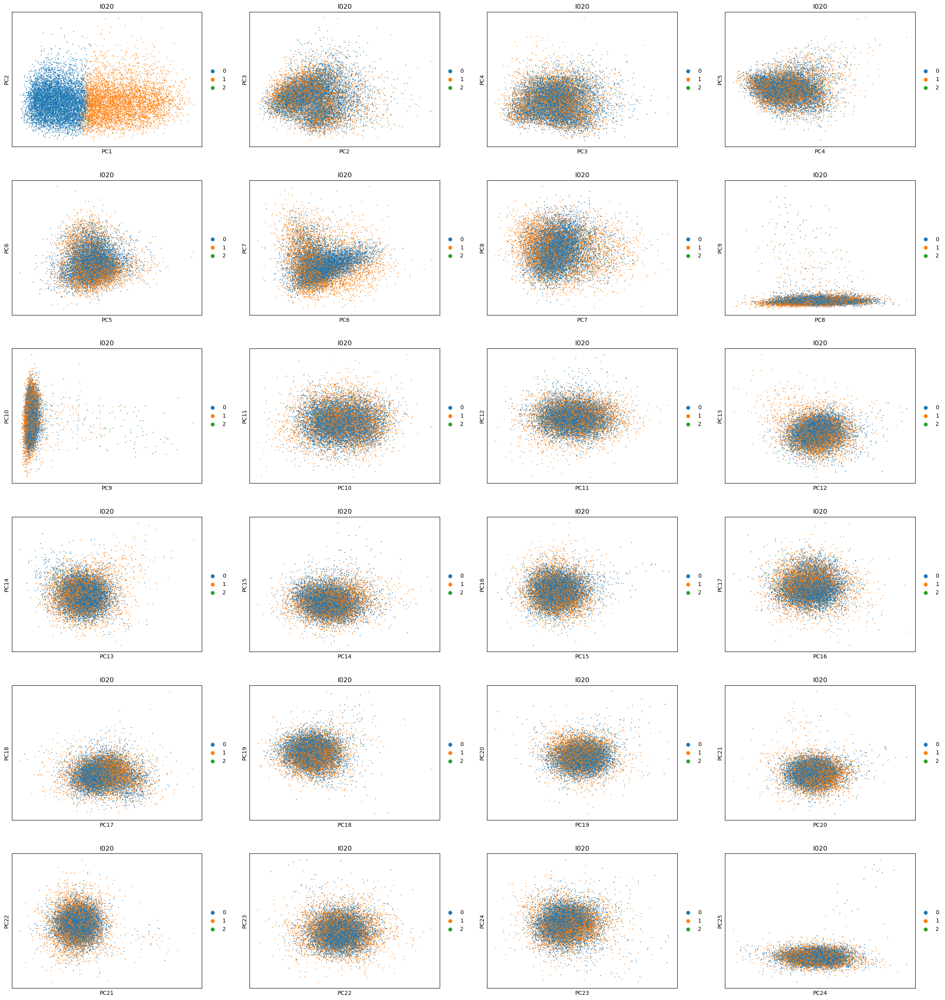

In [29]:
sc.pl.pca(combined_1, color="l020", components=[f'{i},{i+1}' for i in range(1, 25)])

In [30]:
combined_1.varm['all_PCs'] = combined_1.varm['PCs'].copy()

In [31]:
combined_1.obsm['all_X_pca'] = combined_1.obsm['X_pca'].copy()

In [32]:
combined_1.varm['PCs'] = combined_1.varm['all_PCs'][:, list(range(1,50))].copy()

In [33]:
combined_1.obsm['X_pca'] = combined_1.obsm['all_X_pca'][:, list(range(1,50))].copy()

In [34]:
sc.external.pp.bbknn(combined_1, batch_key='person', n_pcs=25)
sc.tl.umap(combined_1)

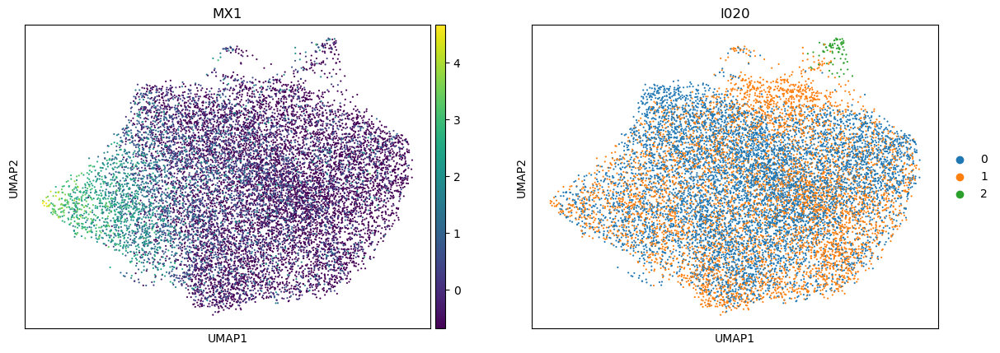

In [35]:
sc.pl.umap(combined_1, color = ['MX1', 'l020'])

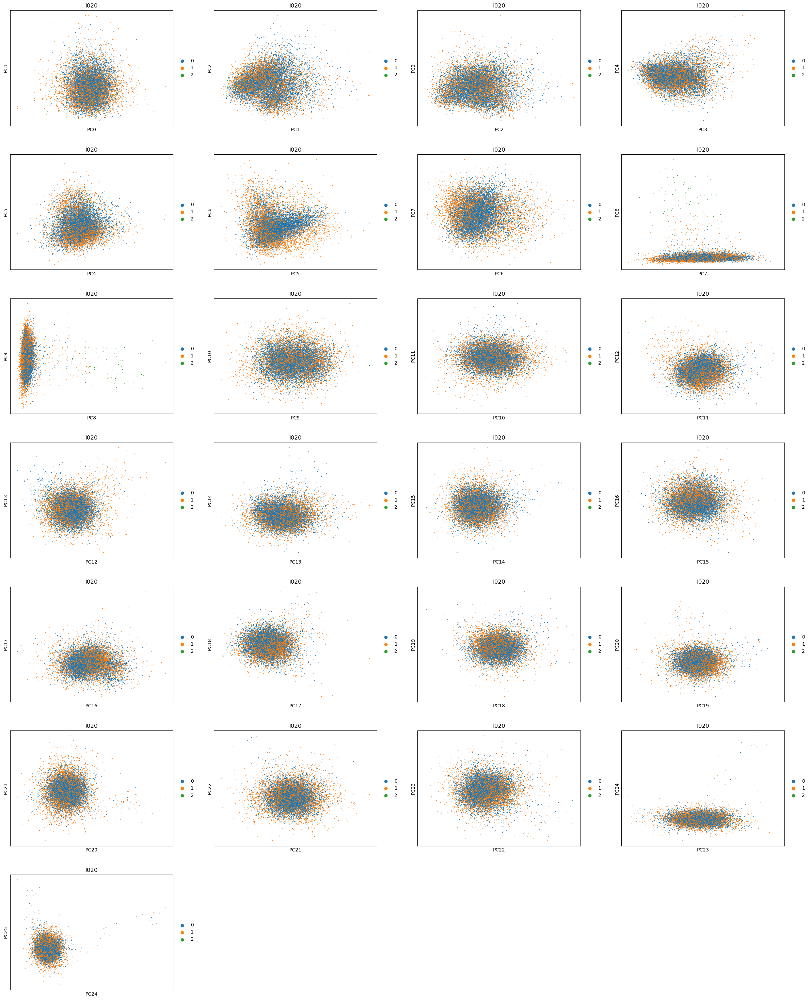

In [36]:
sc.pl.pca(combined_1, color="l020", components=[f'{i},{i+1}' for i in range(25)])

In [37]:
sc.tl.leiden(combined_1, key_added='l020', resolution=0.2)


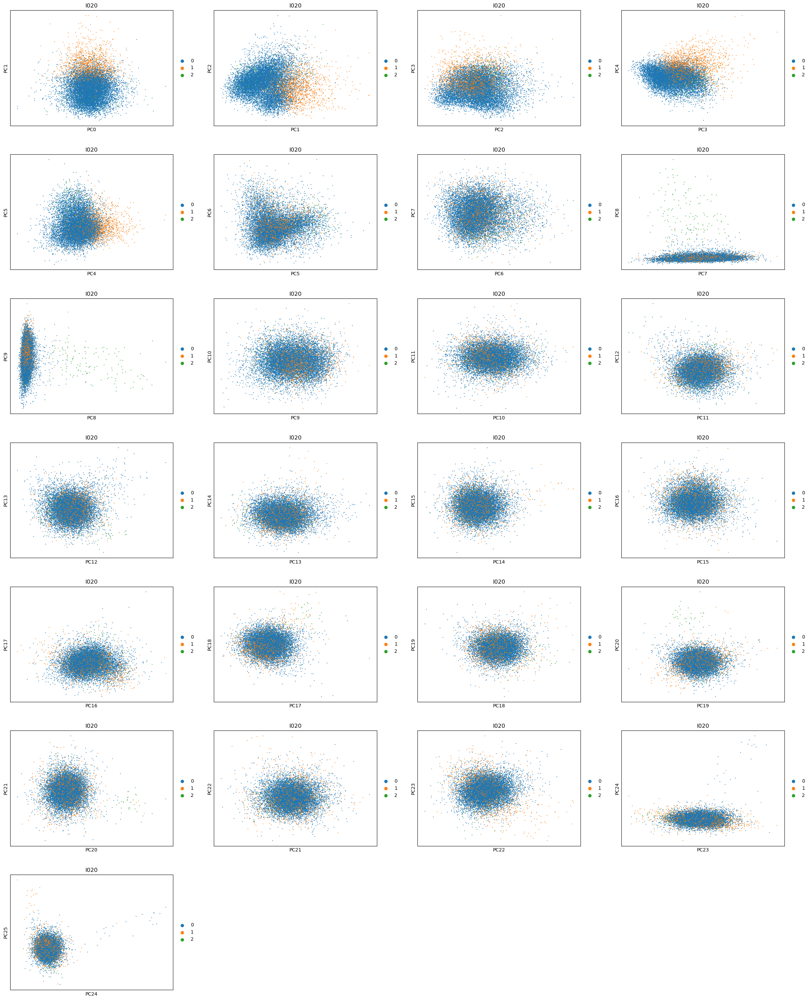

In [38]:
sc.pl.pca(combined_1, color="l020", components=[f'{i},{i+1}' for i in range(25)])

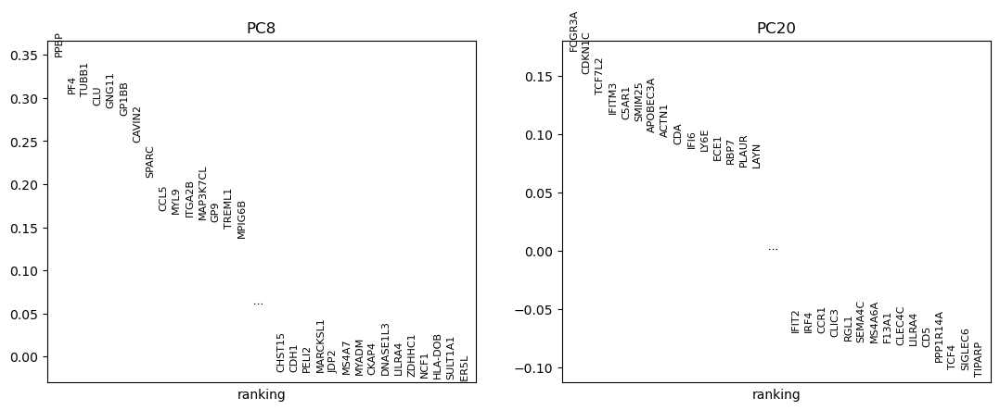

In [39]:
sc.pl.pca_loadings(combined_1, components='8,20')

In [40]:
sc.tl.leiden(combined_1, key_added='l020_1', resolution=0.2, restrict_to=('l020', ['2']))

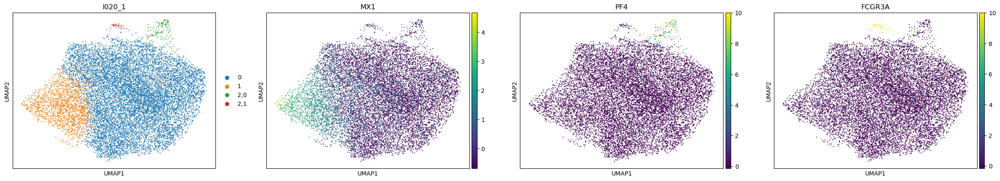

In [41]:
sc.pl.umap(combined_1, color = ['l020_1', 'MX1', 'PF4', 'FCGR3A'])

In [42]:
combined_1.obs['subsets_2'] = combined_1.obs['l020_1'].map({
    '0' : 'cDC2',
    '1' : 'cDC2 ISG Dim',
    '2,0' : 'MGK within cDC2',
    '2,1' : 'CD16 Monocyte within cDC2',
})

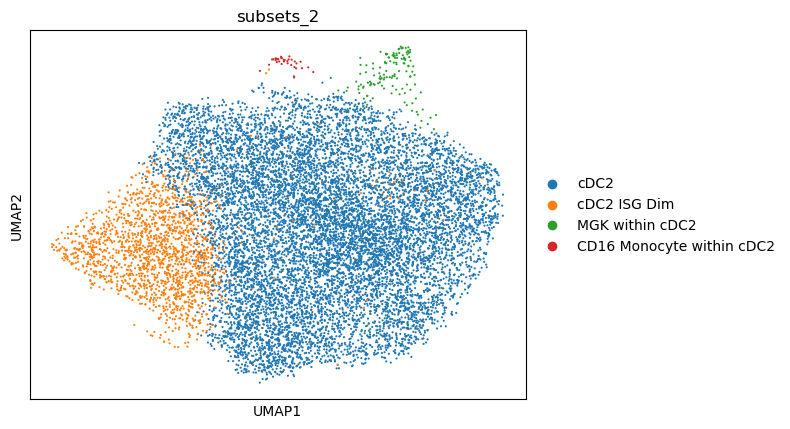

In [43]:
sc.pl.umap(combined_1, color = ['subsets_2'])

In [45]:
combined_1[combined_1.obs.subsets_2.isin({'cDC2', 'cDC2 ISG Dim'})].write_h5ad('cDC2-dim_and_low_only.h5ad')

In [95]:
combined.obs['subsets_2'] = combined.obs['l020'].astype(str)
combined.obs.loc[combined.obs.l020 == '2', 'subsets_2'] = 'cDC2 ISG High'
combined.obs.loc[combined_1.obs_names, 'subsets_2'] = combined_1.obs.subsets_2.astype(str)


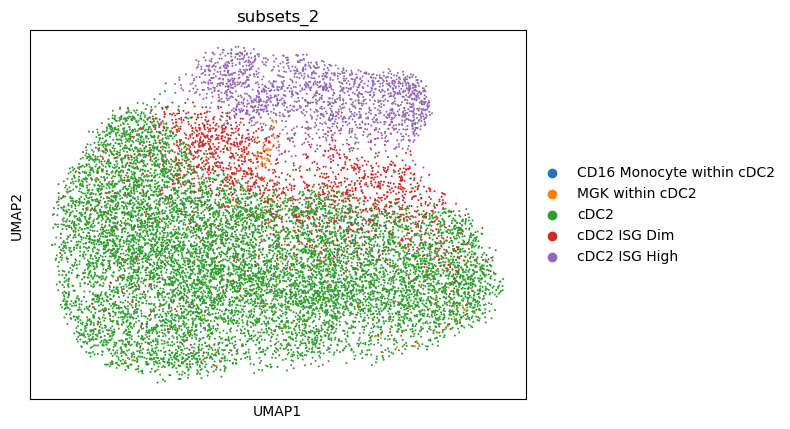

In [96]:
sc.pl.umap(combined, color = ['subsets_2'])

In [97]:
combined.write_h5ad('cDC2-1.h5ad')

In [ ]:
combined[combined.obs.subsets_2.str.startswith('cDC2')].copy().write_h5ad('cDC2-1-c.h5ad')